#### Metode i primjena vjestacke inteligencije
#### Laboratorijska vjezba 9
#### Student: Masovic Haris
#### Index: 1689/17993

## 0. Dependencies

In [1]:
import sys

!{sys.executable} -m pip install matplotlib Image opencv-python

You should consider upgrading via the '/Library/Frameworks/Python.framework/Versions/3.8/bin/python3.8 -m pip install --upgrade pip' command.


## 2. Reprezentacija znanja iz convnet mreze

### 2.1 Vizualizacija posrednih aktivacija

In [2]:
from keras.models import load_model

model = load_model('cats_and_dogs_small_2.h5')
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 15, 15, 128)      

(1, 150, 150, 3)


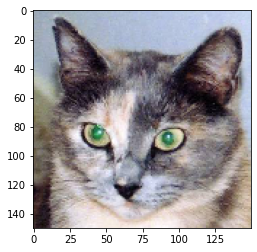

In [3]:
from keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

img_path = './downsized/test/cats/cat.1700.jpg'
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

print(img_tensor.shape)
plt.imshow(img_tensor[0])
plt.show()

(1, 148, 148, 32)


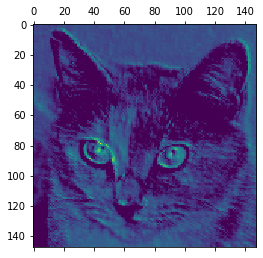

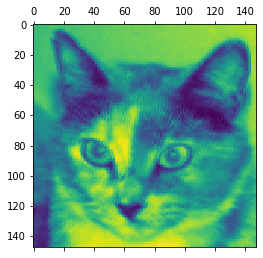

In [4]:
from keras import models
import matplotlib.pyplot as plt

layer_outputs = [layer.output for layer in model.layers[:8]]
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)

first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')
plt.matshow(first_layer_activation[0, :, :, 7], cmap='viridis')

#### 2.1.3 Prikazite prvih 5 i zadnjih 5 aktivacija iz prvog nivoa. Na bazi prikaza slika pokusajte objasniti sta mreza “vidi”.

- Slike su date ispod.
- Mreza vidi odredjene konture, ivice odnosno odredjene znacajke koje su kljucne kao izlaz prvog nivoa.

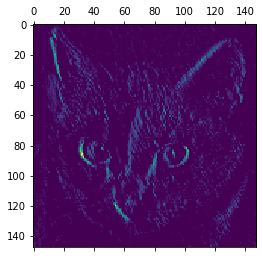

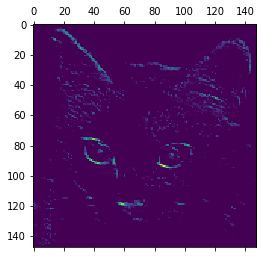

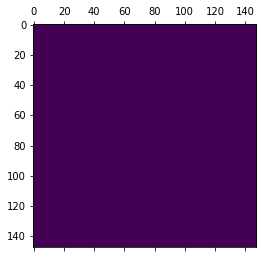

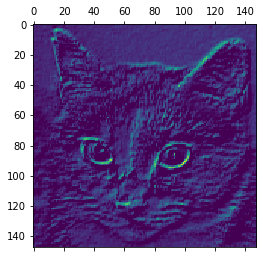

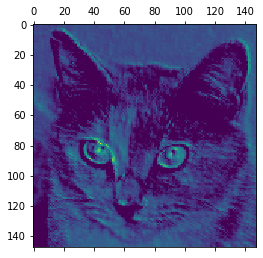

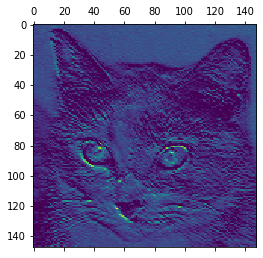

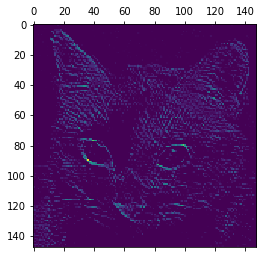

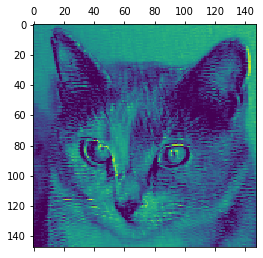

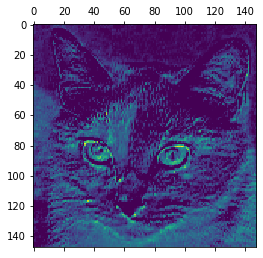

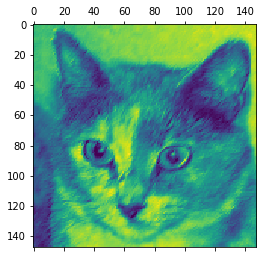

In [5]:
for index in range(0, 5):
    plt.matshow(first_layer_activation[0, :, :, index], cmap='viridis')
    
for index in range(27, 32):
    plt.matshow(first_layer_activation[0, :, :, index], cmap='viridis')

#### 2.1.4 Za zadnji kod (prikaz svih aktivacija), objasnite na koji nacin radi, te prikazite izlaze iz vase mreze. Na osnovu rezultata, detaljno protumacite kako mreza vidi kroz razlicite nivoe mreze.

- Pocetni dat kod je prikazivao samo zadnji layer, u petlju je dodan prikaz svih layera.
- Izlaz koda predstavljaju sve aktivacije kroz sve layere u mrezi za datu sliku.
- Kod za prikaz svih aktivacija kroz mrezu, radi tako sto extract-a broj `feature`-a koje ima, onda na osnovu velicine pravi display matricu sa 16 slika po kolonama pri cemu je broj redova razlicit ovisno od broja `feature`-a. Takodjer se slika priprema za prikaz (oduzimanje srednje vrijednosti, dijeljenje sa standardnom devijacijom i specificiranje, mnozenje i dijeljenje dodatno, te finalno kao tip `uint8`). Za svaki layer se pravi prikaz grid-a za sve aktivacije.
- Vidimo da prolaskom kroz layere mreze, prave se razlicite slike sa razlictim oblicima i konturama, te se na taj nacin traze odnosno specificiraju odredjene znacajke, na osnovu kojih se na kraju omogucava klasifikacija slike. Kako se prolazi kroz layere, sve manje znacajke se gledaju, te vise bitne ali sitnije znacajke su tek na kraju prikazane, dok na pocetku se prikazuju vece vidljive znacajke.

<ipython-input-6-b8df88f9ee75>:16: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


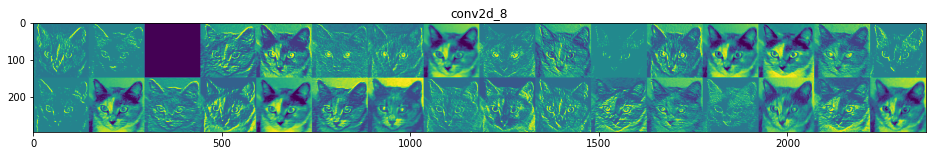

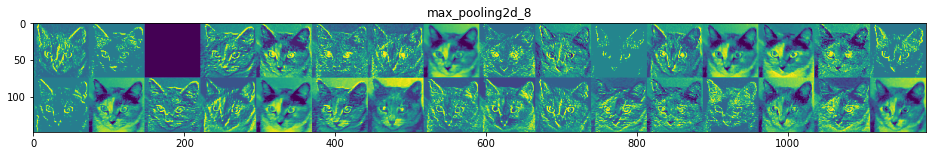

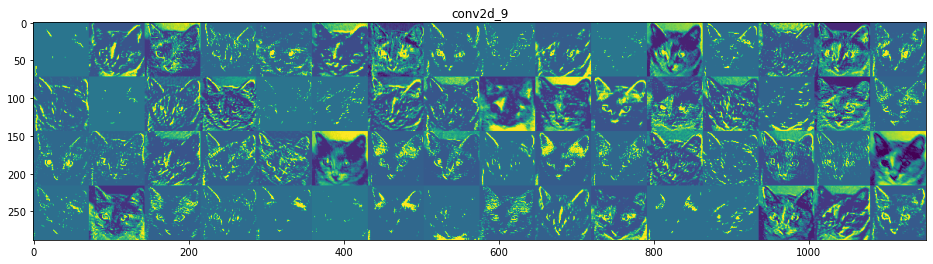

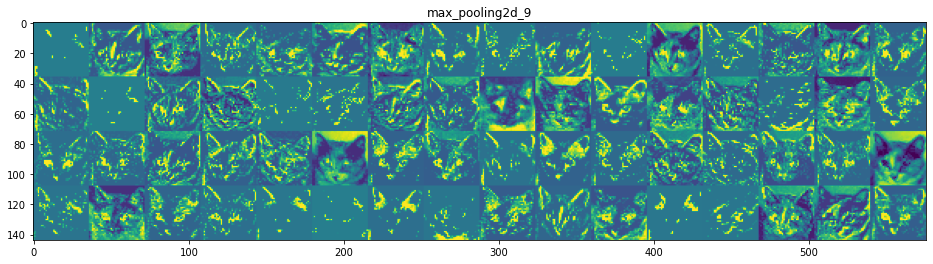

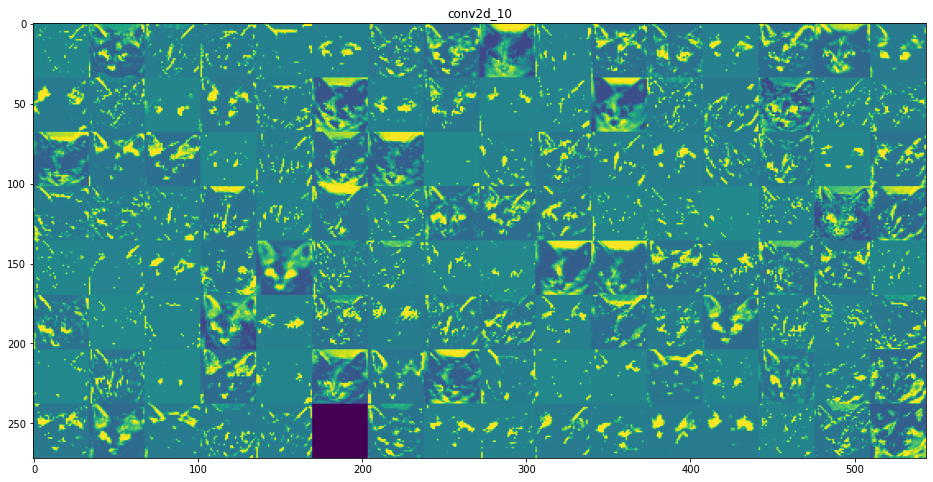

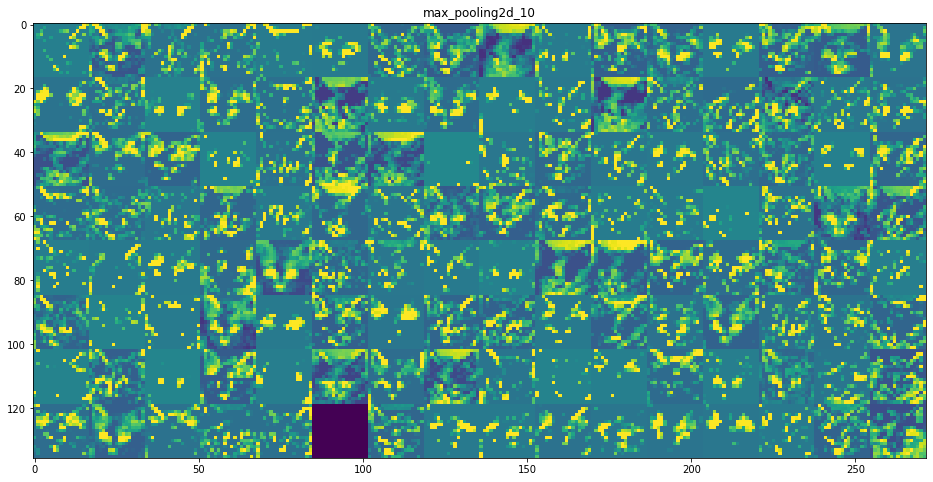

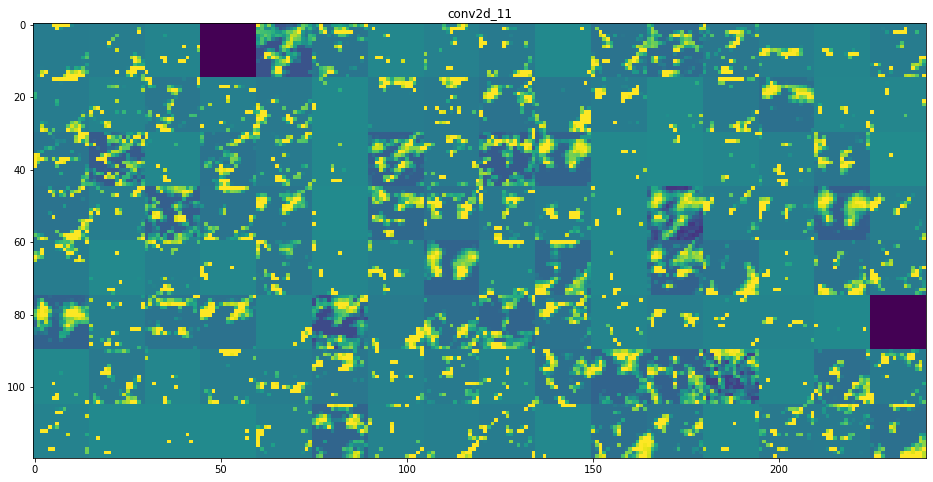

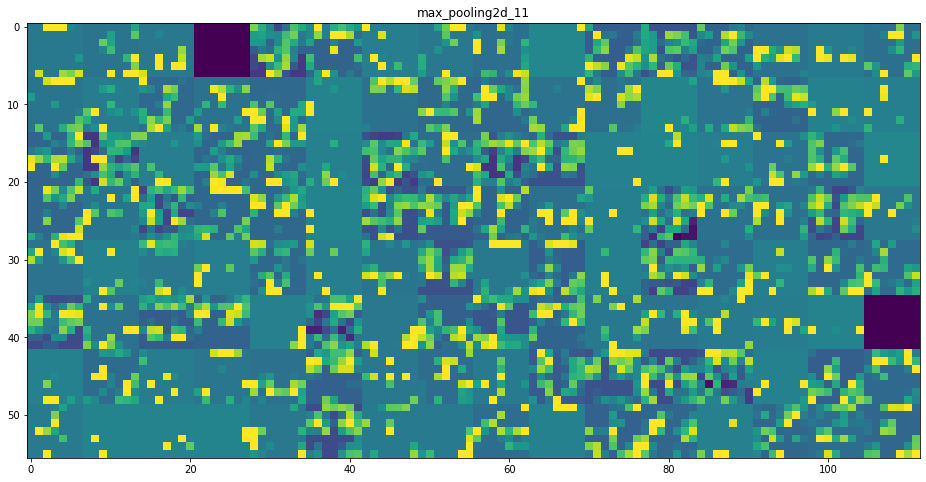

In [6]:
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

### 2.2 Vizualizacija convnet filtera

In [2]:
from keras.applications import VGG16
from keras import backend as K
import numpy as np
import tensorflow as tf

tf.compat.v1.disable_eager_execution()

model = VGG16(weights='imagenet', include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

grads = K.gradients(loss, model.input)[0]
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

iterate = K.function([model.input], [loss, grads])
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.
step = 1.

for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value * step

def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [7]:
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)
    iterate = K.function([model.input], [loss, grads])
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    step = 1.
    
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
    
    img = input_img_data[0]
    return deprocess_image(img)

#### 2.2.1 Detaljno objasnite sve dijelove koda date u ovom podpoglavlju.

- Cilj je napraviti funkciju gubitka koja maximizira vrijednost odredjenog filtera u sloju konvolucije, te koristenjem stohastickog gradijenta prilagoditi vrijednosti slike da se maximizira vrijednost aktivacije.
- Shodno navedenom, da bi se implementirao stohasticki gradijent, treba dobiti gradijente na osnovu gubitka i inputa modela, odnosno u nasem slucaju `grads = K.gradients(loss, model.input)[0]` dobija se tenzor odnosno gradijent koji nama treba.
- Dalje treba uraditi normalizaciju, a to radimo pomocu sljedece linije koda `grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)`. Na ovaj nacin normaliziramo gradijent i omogucavamo glatki prolazak, `1e-5` dodajmo da ne bi imali dijeljenje sa nulom.
- Sada treba izracunati vrijednost gubitka i vrijednost gradijenta na osnovu ulaznih podataka i tenzora gradijenta kojeg imamo, to radimo pomocu definisanje funkcije `iterate` kao: `iterate = K.function([model.input], [loss, grads])`, te komandom `loss_value, grads_value = iterate([input_img_data])` pri cemu je pocetni `input_img_data` definisan kao `input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.` tj. kao siva slika sa sumom.
- Sada mozemo zavrtiti petlju u kojoj cemo mijenjati `input_img_data` i kao takvog proslijediti `deprocess_image` funkciji.
- Funkcija `deprocess_image` je zaduzena da normalizira tenzor, cetnrira na nuli i radi `clip`-anje na segmentu `[0,1]`. Takodjer funkcija pretvara sliku u `RGB` array te vraca kao izlaznu vrijednost.
- Kada se sve navedeno uklopi dobije se funkija koja generise pattern za odredjeni layer i filter index-a, sto vidimo. u kodu u kojem generisemo 8x8 sliku gdje se poziva `generate_pattern` funkcija. 

#### 2.2.2 Za svaki konvolucioni blok prikazite izgled prva 64 filtera, te zatim intuitivno pokusajte objasniti kako mreza “vidi”.

- Prva verzija nije sadrzavala ovu sekciju, ali nakon rjesavanja problema, sad se i ova sekcija nalazi u izvjestaju.
- Vidimo da se kroz svaki block preciznije generise filter odnosno da kroz svaki block se znacajke poboljsavaju, tako  sto prvi layer detektuje teksturu, dok drugi block detektuje teksture zajedno sa ivicama, treci block koji dodaje i patterne na to i tako do petog block-a koji uzima sve navedeno u obzir i formira finalne filtere.
- Prikaz 64 filtera za svaki konvolucioni blok dato je ispod.

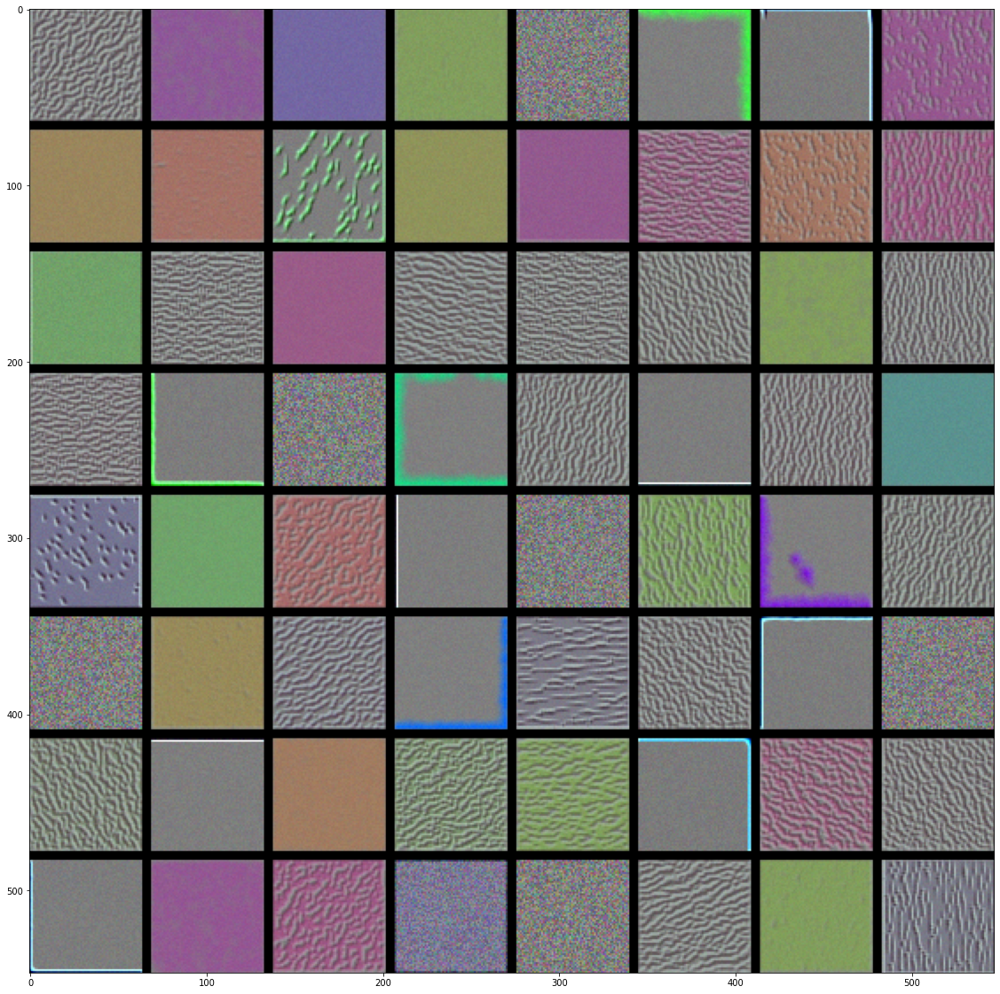

In [8]:
import numpy as np 
import matplotlib.pyplot as plt

size = 64
margin = 5

def generate_block(layer_name):
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):
        for j in range(8):
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    plt.figure(figsize=(20, 20))
    plt.imshow(results / 255)
    

generate_block('block1_conv1')

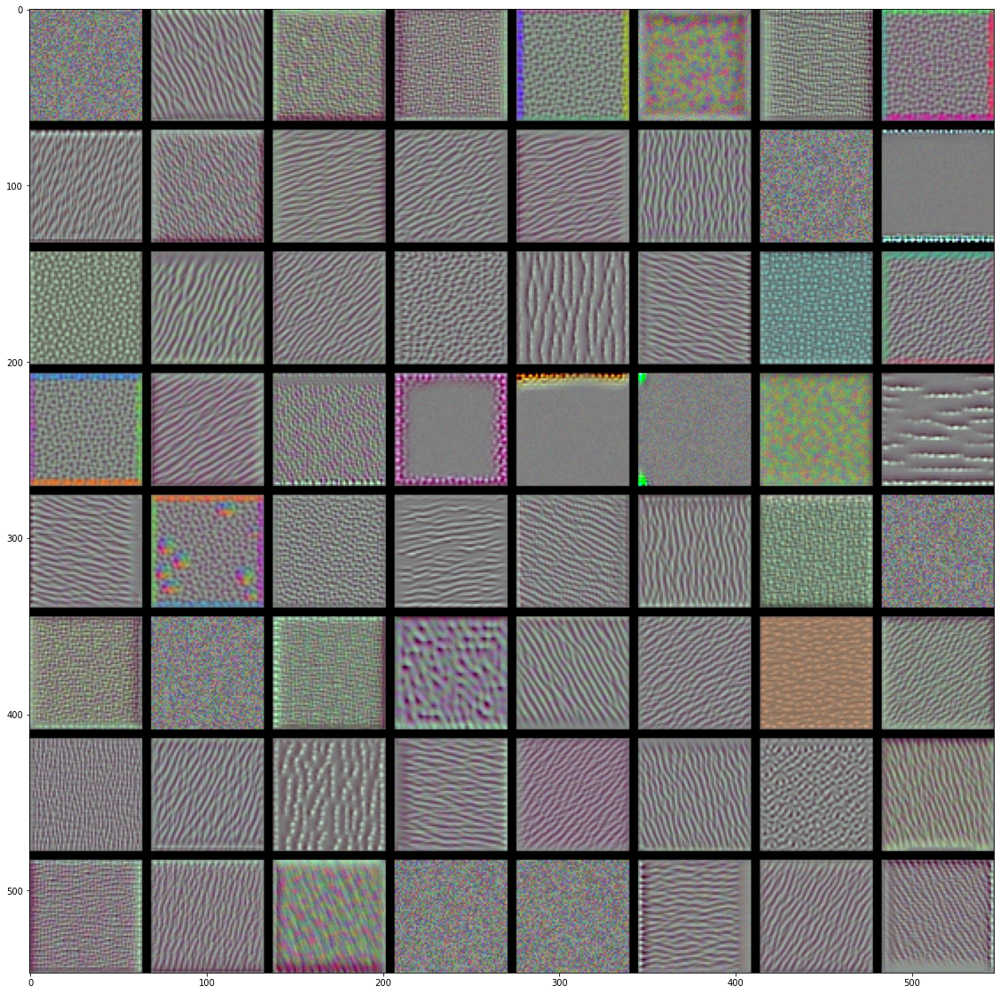

In [9]:
generate_block('block2_conv1')

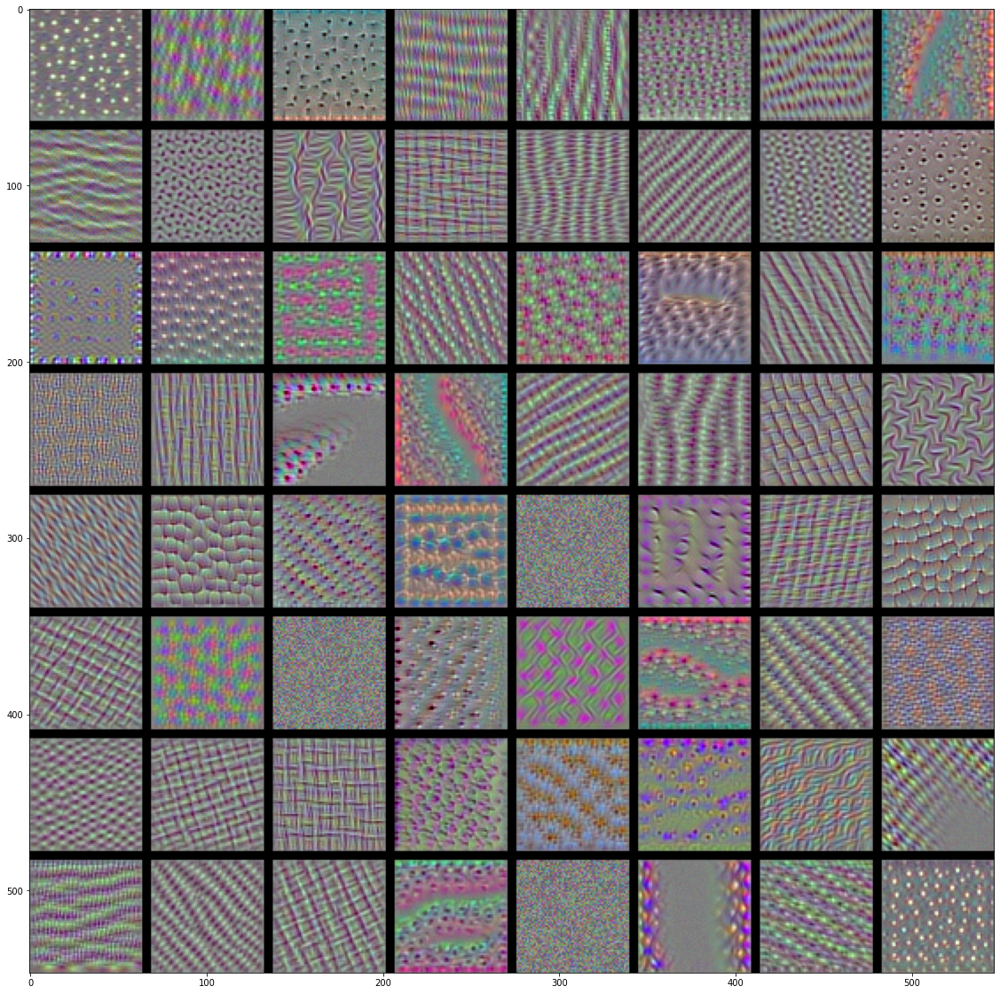

In [10]:
generate_block('block3_conv1')

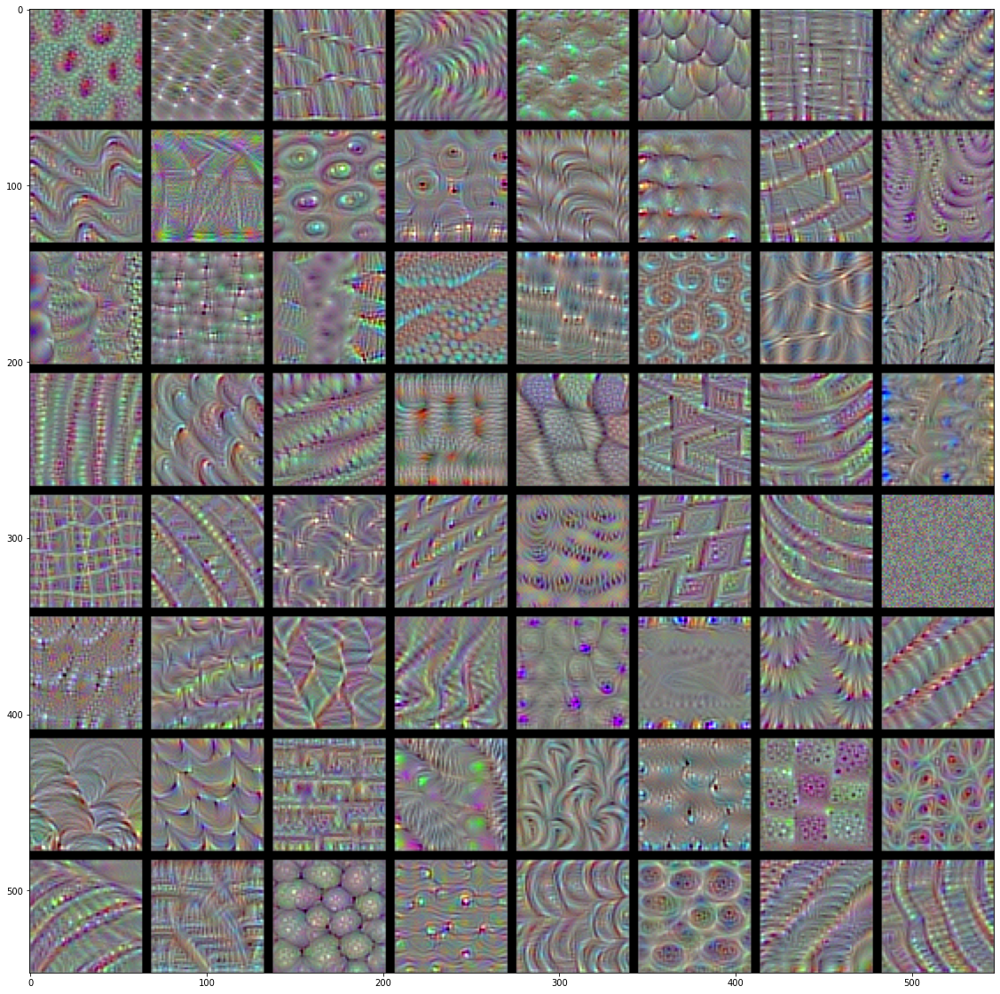

In [11]:
generate_block('block4_conv1')

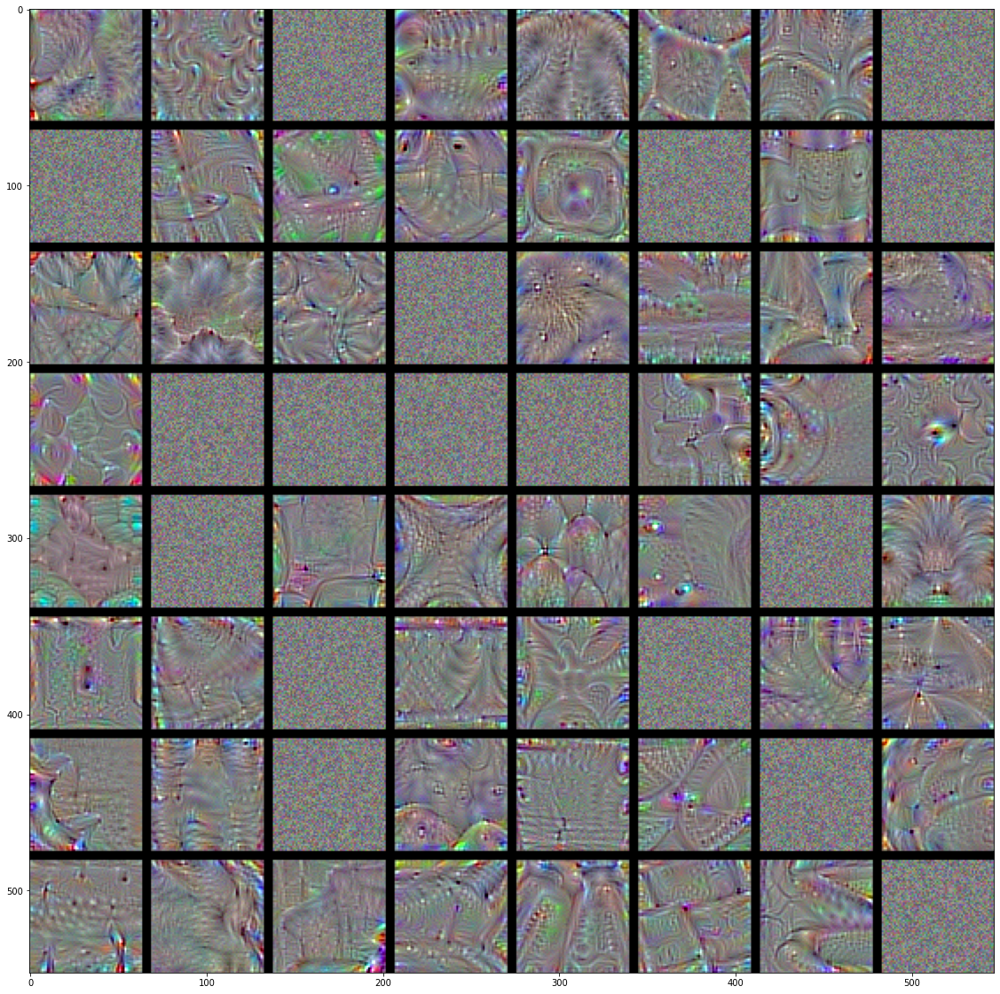

In [12]:
generate_block('block5_conv1')

### 2.3 Vizualizacija heatmap-a

Predicted: [[('n02109525', 'Saint_Bernard', 0.991146)]]


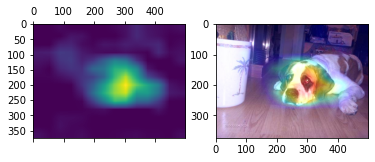

In [81]:
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras import backend as K
import matplotlib.pyplot as plt
import numpy as np
import cv2
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

tf.compat.v1.disable_eager_execution()

def heatmap_vis(model, pic_name, output_name):
    img_path = './downsized/test/' + pic_name + '.jpg'

    img = image.load_img(img_path, target_size=(224, 224))

    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)

    preds = model.predict(x)
    
    print('Predicted:', decode_predictions(preds, top=1))
    
    african_elephant_output = model.output[:, np.argmax(preds[0])]
    last_conv_layer = model.get_layer('block5_conv3')

    grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]]) 
    pooled_grads_value, conv_layer_output_value = iterate([x])
    
    for i in range(512):
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

    heatmap = np.mean(conv_layer_output_value, axis=-1)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    # plt.matshow(heatmap)
    heatmap_to_show = heatmap
    
    img = cv2.imread(img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_to_show = heatmap
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = heatmap * 0.4 + img
    cv2.imwrite(output_name + '.jpg', superimposed_img)

    img = mpimg.imread(output_name + '.jpg')
    fix, ax = plt.subplots(1, 2)
    ax[0].matshow(heatmap_to_show)
    ax[1].imshow(img)
    plt.show()

    
model = VGG16(weights='imagenet')
heatmap_vis(model, 'dogs/dog.1702', 'dog.1702')

#### 2.3.1 U vjezbi je koristen VGG16 model. Generisite heatmap-e za 6 proizvoljnih slika iz testnog skupa za tri modela mreza koji ste generisali u lab. vjezbi 8. Detaljno prokomentarisite rezultate i efikasnost modela koristenjem rezultata heatmap-a. U izvjestaju navedite izlaze izabranih slika za sve modele.

Nakon vise pokusaja (nakon save-anje modela iz prosle vjezbe) nisam uspio extractovati konvolucioni layer iz Functional layera mreze iz lab 8, shodno time 6 slika je uradjeno na obicnom vgg16 modelu i dati su komentari u nastavku i efikasnost vgg16 modela za heatmap varijante!

- Mozemo primijetiti da heatmap se fokusira oko najbitnijih znacajki za svoju klasu odnosno da najbitnije znacajke vezane za specificnu klasu su vise crvenije, dok znacajke koje su isto bitne ali ne toliko su vise zelenom bojom oznacene.
- Takodjer mozemo primijetiti da za nas model tj. klase cuka i maca, imamo i tipove i da za svaku specificnu klasu za odredjene znacajke generise heatmapu ka tim znacajkama.
- Efikasnost modela je dobra, odnosno na izabranim 6 slika iz testnog dataset-a vidimo da je model tacan za svoj output, ujedno da su znacajke za tu specificnu klasu tacne, gledajuci sa heatmape perspektive.
- Prikaz svih rezultata heatmape zajedno sa heatmapom na prvenstvenim slikama su date ispod.

In [88]:
from keras.models import load_model

model_1 = model
# model_1 = load_model('model_1.h5')
# model_1.summary()
# model_2 = load_model('model_2.h5')
# model_2.summary()
# model_3 = load_model('model_3.h5')
# model_3.summary()

Predicted: [[('n02090379', 'redbone', 0.21782249)]]


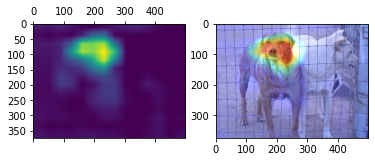

In [89]:
heatmap_vis(model_1, 'dogs/dog.1703', 'dog.1703')

Predicted: [[('n02085620', 'Chihuahua', 0.47246817)]]


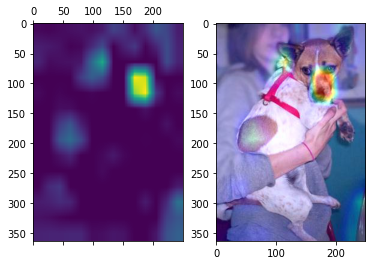

In [90]:
heatmap_vis(model_1, 'dogs/dog.1704', 'dog.1704')

Predicted: [[('n02090379', 'redbone', 0.40278742)]]


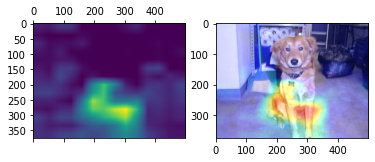

In [91]:
heatmap_vis(model_1, 'dogs/dog.1705', 'dog.1705')

Predicted: [[('n02123394', 'Persian_cat', 0.6731525)]]


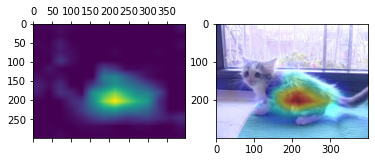

In [92]:
heatmap_vis(model_1, 'cats/cat.1706', 'cat.1706')

Predicted: [[('n02123159', 'tiger_cat', 0.38916698)]]


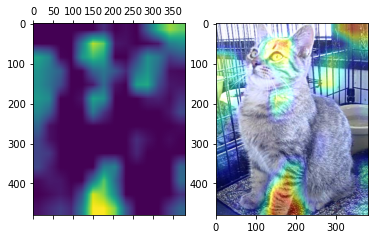

In [93]:
heatmap_vis(model_1, 'cats/cat.1707', 'cat.1707')

Predicted: [[('n02123045', 'tabby', 0.2852334)]]


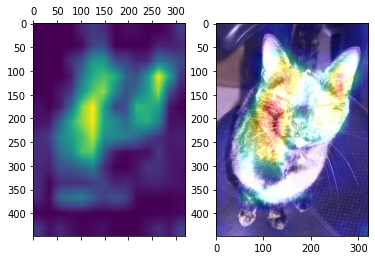

In [94]:
heatmap_vis(model_1, 'cats/cat.1708', 'cat.1708')